## Import Modules

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import warnings
from tqdm.notebook import tqdm

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, array_to_img
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy

warnings.filterwarnings('ignore')

## Load the files

In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("splcher/animefacedataset")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'animefacedataset' dataset.
Path to dataset files: /kaggle/input/animefacedataset


In [3]:
# load complete image paths to the list
image_paths = []
BASE_DIR = "/kaggle/input/animefacedataset" # Use the path from kagglehub download
# Recursively find all files in the directory and its subdirectories
for root, _, files in os.walk(BASE_DIR):
    for file in files:
        # Construct the full path to the file
        image_path = os.path.join(root, file)
        image_paths.append(image_path)

In [4]:
image_paths[:5]

['/kaggle/input/animefacedataset/images/35715_2011.jpg',
 '/kaggle/input/animefacedataset/images/48610_2014.jpg',
 '/kaggle/input/animefacedataset/images/34719_2011.jpg',
 '/kaggle/input/animefacedataset/images/40266_2012.jpg',
 '/kaggle/input/animefacedataset/images/4199_2002.jpg']

## Visualize the Image Dataset

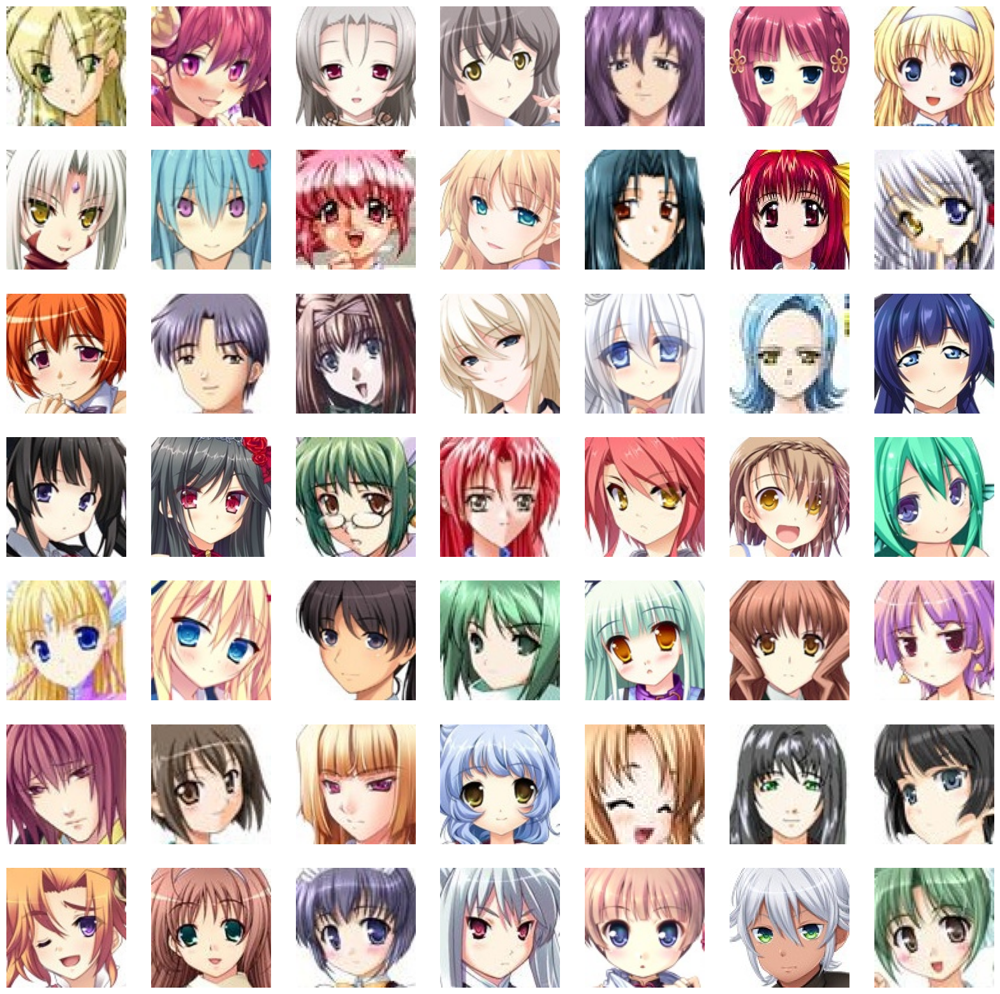

In [5]:
# to display grid of images (7x7)
plt.figure(figsize=(20, 20))
temp_images = image_paths[:49]
index = 1

for image_path in temp_images:
    plt.subplot(7, 7, index)
    # load the image
    img = load_img(image_path)
    # convert to numpy array
    img = np.array(img)
    # show the image
    plt.imshow(img)
    plt.axis('off')
    # increment the index for next image
    index += 1

## Preprocess Images

In [6]:
# load the image, resize it, and convert to numpy array
train_images = [np.array(load_img(path, target_size=(64, 64))) for path in tqdm(image_paths)]
train_images = np.array(train_images)

  0%|          | 0/63565 [00:00<?, ?it/s]

In [7]:
train_images[0].shape

(64, 64, 3)

In [8]:
# reshape the array
train_images = train_images.reshape(train_images.shape[0], 64, 64, 3).astype('float32')

In [9]:
# normalize the images
train_images = (train_images - 127.5) / 127.5

In [10]:
train_images[0]

array([[[ 0.28627452,  0.24705882,  0.07450981],
        [ 0.8509804 ,  0.81960785,  0.62352943],
        [ 0.1764706 ,  0.16862746, -0.06666667],
        ...,
        [ 0.25490198,  0.23137255, -0.09019608],
        [ 0.34901962,  0.31764707,  0.04313726],
        [ 0.827451  ,  0.77254903,  0.5529412 ]],

       [[ 1.        ,  1.        ,  0.8039216 ],
        [ 0.30980393,  0.2784314 ,  0.06666667],
        [-0.05882353, -0.06666667, -0.30980393],
        ...,
        [ 0.5137255 ,  0.49803922,  0.12156863],
        [-0.07450981, -0.10588235, -0.40392157],
        [ 0.49803922,  0.4509804 ,  0.2       ]],

       [[ 0.09019608,  0.05882353, -0.16862746],
        [-0.5372549 , -0.56078434, -0.8039216 ],
        [ 0.90588236,  0.8901961 ,  0.5921569 ],
        ...,
        [ 0.5294118 ,  0.5137255 ,  0.06666667],
        [ 0.03529412,  0.00392157, -0.37254903],
        [ 0.06666667,  0.02745098, -0.27058825]],

       ...,

       [[ 0.9764706 ,  1.        ,  0.9843137 ],
        [ 0

## Create Generator & Discriminator Models

In [11]:
# latent dimension for random noise
LATENT_DIM = 100
# weight initializer
WEIGHT_INIT = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# no. of channels of the image
CHANNELS = 3 # for gray scale, keep it as 1

### Generator Model

Generator Model will create new images similar to training data from random noise

In [12]:
model = Sequential(name='generator')

# 1d random noise
model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# convert 1d to 3d
model.add(layers.Reshape((8, 8, 512)))

# upsample to 16x16
model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# upsample to 32x32
model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# upsample to 64x64
model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

model.add(layers.Conv2D(CHANNELS, (4, 4), padding='same', activation='tanh'))

generator = model
generator.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 32768)          │     3,309,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu (ReLU)                    │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 16, 16, 256)    │     2,097,408 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_1 (ReLU)                  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 32, 32, 128)    │       524,416 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_2 (ReLU)                  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 64, 64, 64)     │       131,136 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_3 (ReLU)                  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 64, 64, 3)      │         3,075 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,065,603 (23.14 MB)

 Trainable params: 6,065,603 (23.14 MB)

 Non-trainable params: 0 (0.00 B)

### Discriminator Model

Discriminator model will classify the image from the generator to check whether it real (or) fake images.

In [13]:
model = Sequential(name='discriminator')
input_shape = (64, 64, 3)
alpha = 0.2

# create conv layers
model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Flatten())
model.add(layers.Dropout(0.3))

# output class
model.add(layers.Dense(1, activation='sigmoid'))

discriminator = model
discriminator.summary()

Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 64)     │         3,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 128)    │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 8, 8, 128)      │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 8, 8, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 406,081 (1.55 MB)

 Trainable params: 405,441 (1.55 MB)

 Non-trainable params: 640 (2.50 KB)

## Create DCGAN

In [14]:
class DCGAN(keras.Model):
    def __init__(self, generator, discriminator, latent_dim):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim
        self.g_loss_metric = keras.metrics.Mean(name='g_loss')
        self.d_loss_metric = keras.metrics.Mean(name='d_loss')

    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_loss_metric]

    def compile(self, g_optimizer, d_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.loss_fn = loss_fn

    def train_step(self, real_images):
        # get batch size from the data
        batch_size = tf.shape(real_images)[0]
        # generate random noise
        random_noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # train the discriminator with real (1) and fake (0) images
        with tf.GradientTape() as tape:
            # compute loss on real images
            pred_real = self.discriminator(real_images, training=True)
            # generate real image labels
            real_labels = tf.ones((batch_size, 1))
            # label smoothing
            real_labels += 0.05 * tf.random.uniform(tf.shape(real_labels))
            d_loss_real = self.loss_fn(real_labels, pred_real)

            # compute loss on fake images
            fake_images = self.generator(random_noise)
            pred_fake = self.discriminator(fake_images, training=True)
            # generate fake labels
            fake_labels = tf.zeros((batch_size, 1))
            d_loss_fake = self.loss_fn(fake_labels, pred_fake)

            # total discriminator loss
            d_loss = (d_loss_real + d_loss_fake) / 2

        # compute discriminator gradients
        gradients = tape.gradient(d_loss, self.discriminator.trainable_variables)
        # update the gradients
        self.d_optimizer.apply_gradients(zip(gradients, self.discriminator.trainable_variables))


        # train the generator model
        labels = tf.ones((batch_size, 1))
        # generator want discriminator to think that fake images are real
        with tf.GradientTape() as tape:
            # generate fake images from generator
            fake_images = self.generator(random_noise, training=True)
            # classify images as real or fake
            pred_fake = self.discriminator(fake_images, training=True)
            # compute loss
            g_loss = self.loss_fn(labels, pred_fake)

        # compute gradients
        gradients = tape.gradient(g_loss, self.generator.trainable_variables)
        # update the gradients
        self.g_optimizer.apply_gradients(zip(gradients, self.generator.trainable_variables))

        # update states for both models
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {'d_loss': self.d_loss_metric.result(), 'g_loss': self.g_loss_metric.result()}

In [15]:
class DCGANMonitor(keras.callbacks.Callback):
    def __init__(self, num_imgs=25, latent_dim=100):
        self.num_imgs = num_imgs
        self.latent_dim = latent_dim
        # create random noise for generating images
        self.noise = tf.random.normal([25, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        # generate the image from noise
        g_img = self.model.generator(self.noise)
        # denormalize the image
        g_img = (g_img * 127.5) + 127.5
        g_img.numpy()

        fig = plt.figure(figsize=(8, 8))
        for i in range(self.num_imgs):
            plt.subplot(5, 5, i+1)
            img = array_to_img(g_img[i])
            plt.imshow(img)
            plt.axis('off')
        # plt.savefig('epoch_{:03d}.png'.format(epoch))
        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [16]:
dcgan = DCGAN(generator=generator, discriminator=discriminator, latent_dim=LATENT_DIM)

In [17]:
D_LR = 0.0001
G_LR = 0.0003
dcgan.compile(g_optimizer=Adam(learning_rate=G_LR, beta_1=0.5), d_optimizer=Adam(learning_rate=D_LR, beta_1=0.5), loss_fn=BinaryCrossentropy())

Epoch 1/20
1987/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.8042 - g_loss: 2.2657

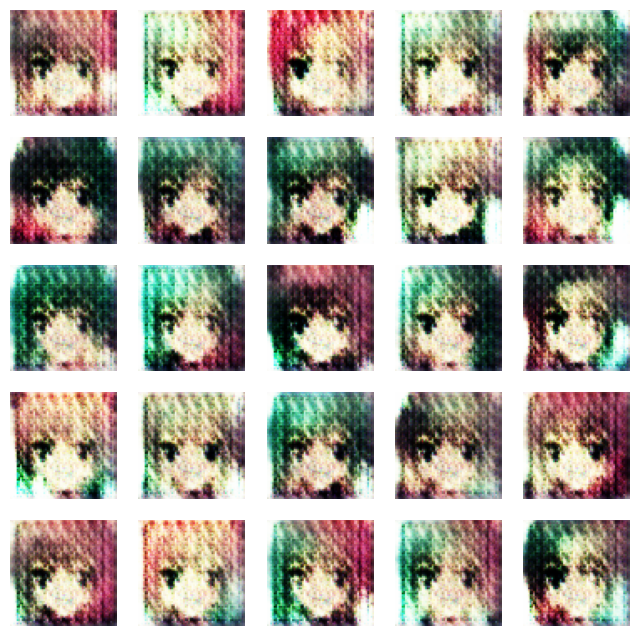

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 141s 62ms/step - d_loss: 0.8040 - g_loss: 2.2657
Epoch 2/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.6276 - g_loss: 1.6771

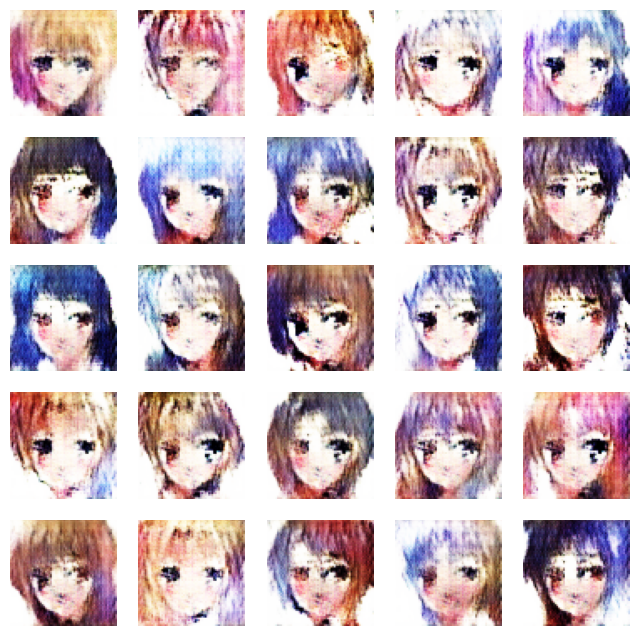

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 121s 61ms/step - d_loss: 0.6276 - g_loss: 1.6770
Epoch 3/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.6635 - g_loss: 1.2872

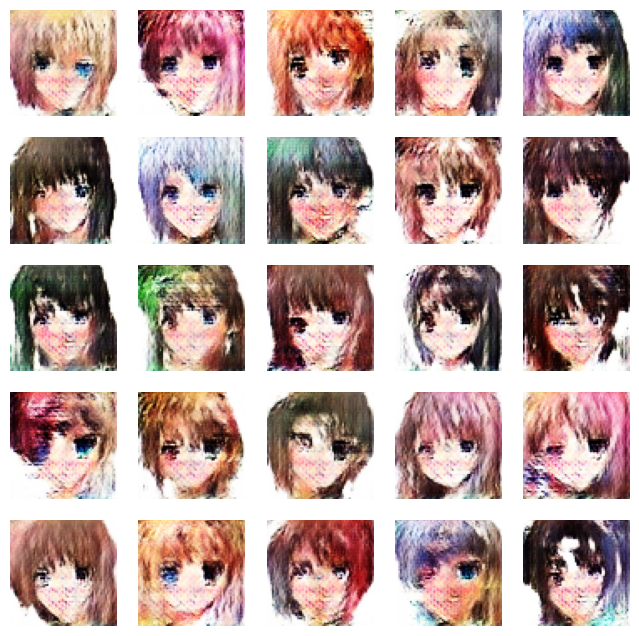

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 121s 61ms/step - d_loss: 0.6635 - g_loss: 1.2871
Epoch 4/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.6704 - g_loss: 1.1087

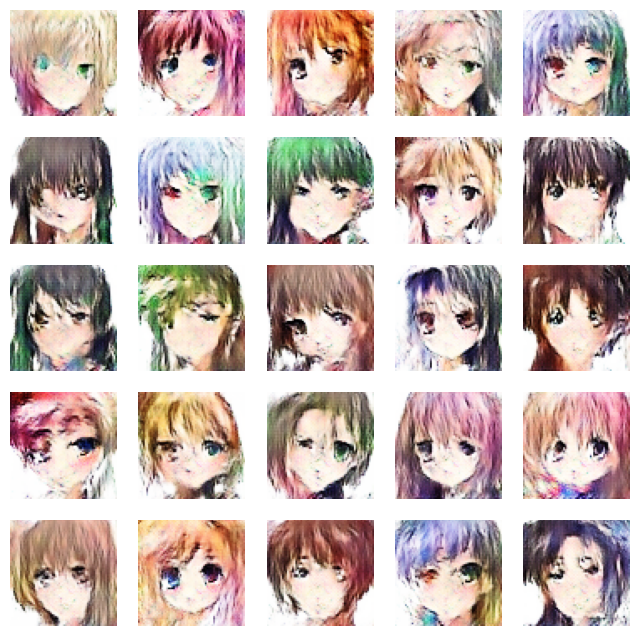

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 122s 61ms/step - d_loss: 0.6704 - g_loss: 1.1087
Epoch 5/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.6983 - g_loss: 0.9421

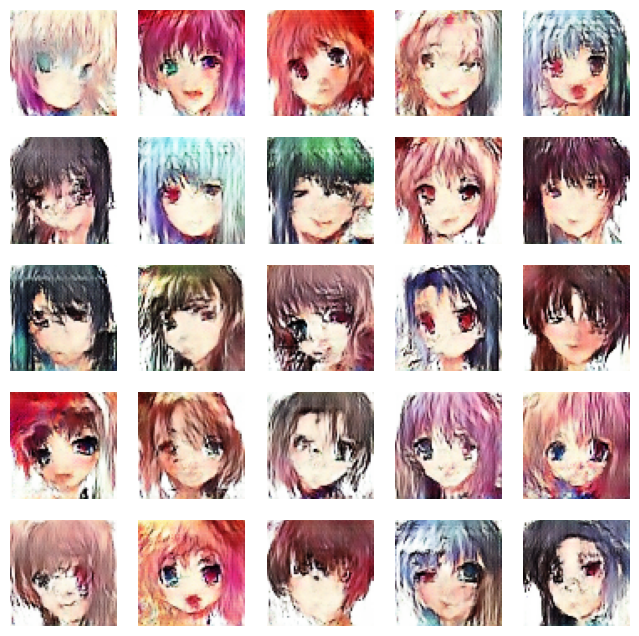

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 121s 61ms/step - d_loss: 0.6983 - g_loss: 0.9421
Epoch 6/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.7018 - g_loss: 0.8340

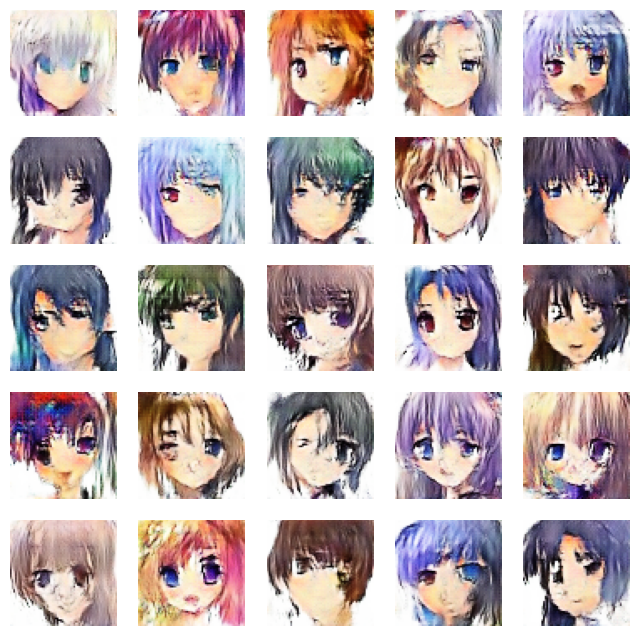

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 122s 61ms/step - d_loss: 0.7018 - g_loss: 0.8340
Epoch 7/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.7052 - g_loss: 0.7953

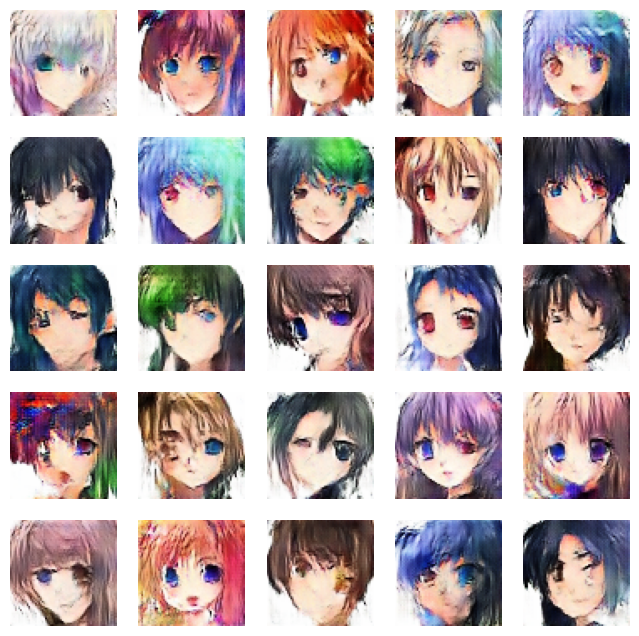

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 122s 61ms/step - d_loss: 0.7052 - g_loss: 0.7953
Epoch 8/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.7041 - g_loss: 0.7702

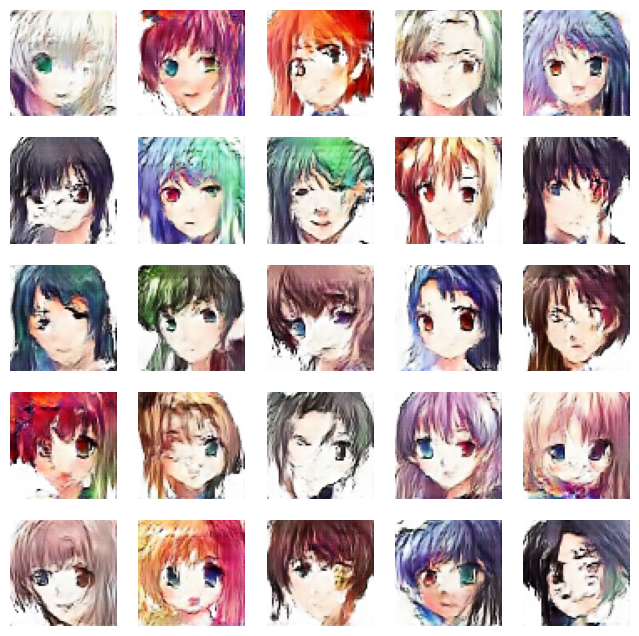

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 122s 61ms/step - d_loss: 0.7041 - g_loss: 0.7702
Epoch 9/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.6999 - g_loss: 0.7557

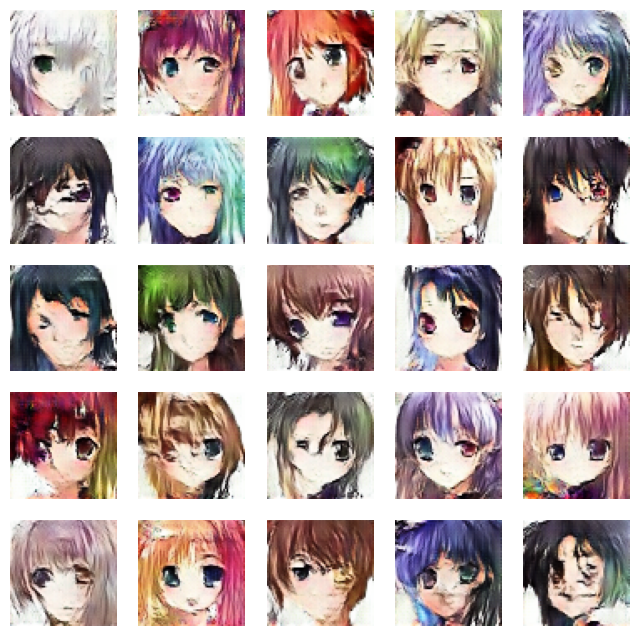

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 122s 61ms/step - d_loss: 0.6999 - g_loss: 0.7557
Epoch 10/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.6983 - g_loss: 0.7541

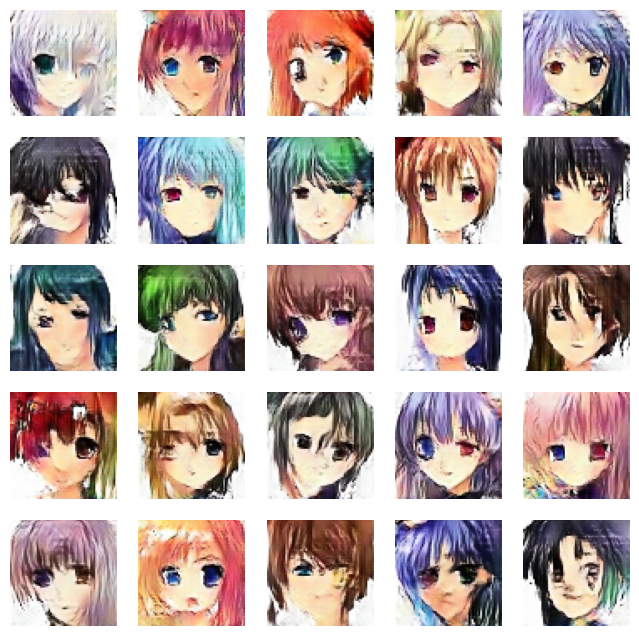

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 122s 61ms/step - d_loss: 0.6983 - g_loss: 0.7541
Epoch 11/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.6950 - g_loss: 0.7526

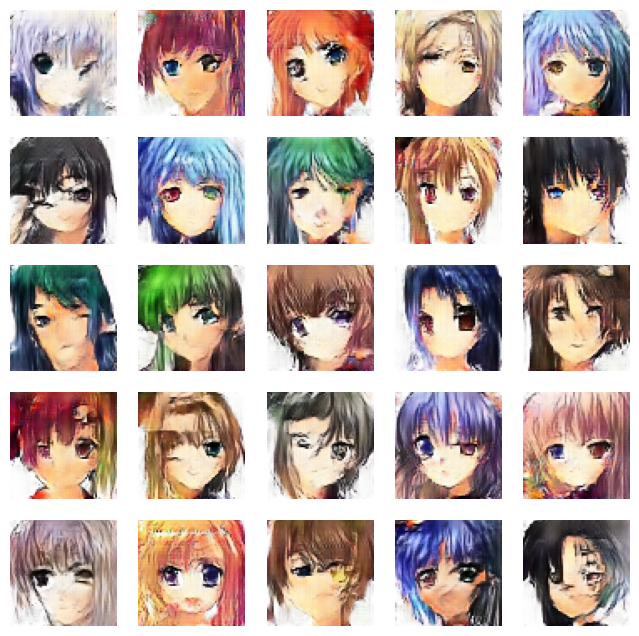

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 121s 61ms/step - d_loss: 0.6950 - g_loss: 0.7526
Epoch 12/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.6937 - g_loss: 0.7541

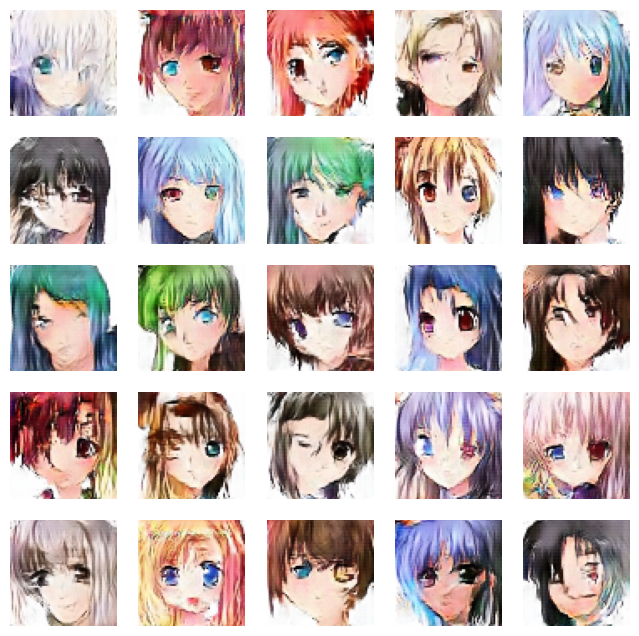

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 122s 61ms/step - d_loss: 0.6937 - g_loss: 0.7541
Epoch 13/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.6914 - g_loss: 0.7599

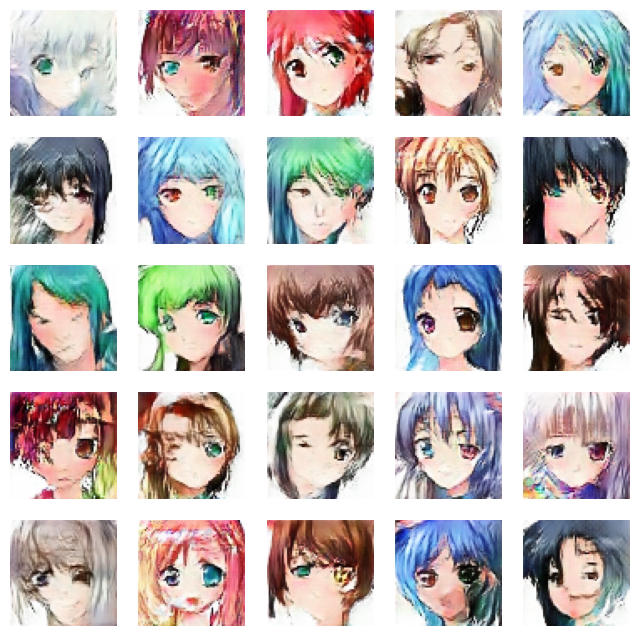

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 122s 61ms/step - d_loss: 0.6914 - g_loss: 0.7599
Epoch 14/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.6886 - g_loss: 0.7638

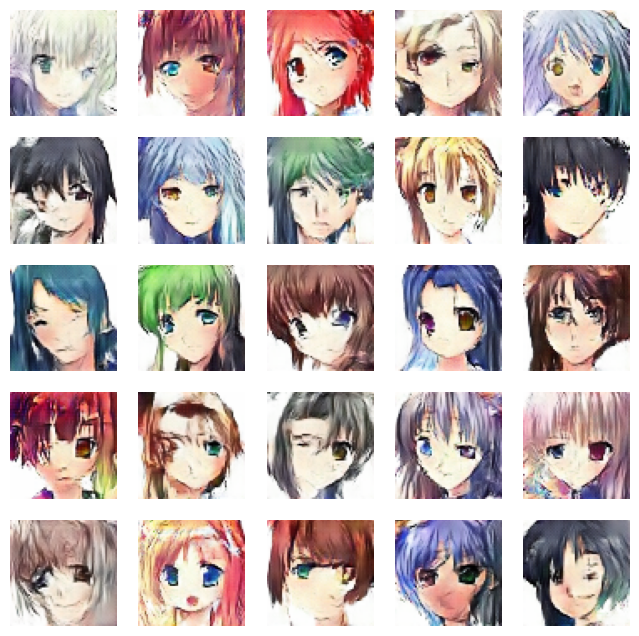

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 122s 61ms/step - d_loss: 0.6886 - g_loss: 0.7638
Epoch 15/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.6862 - g_loss: 0.7707

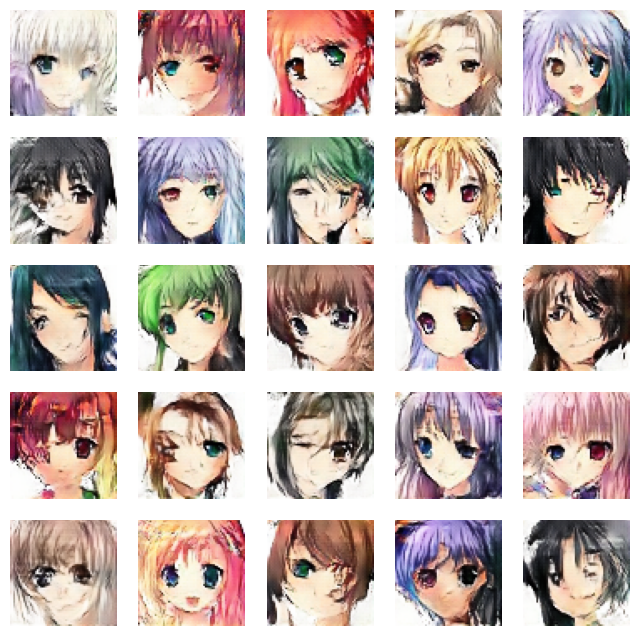

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 122s 61ms/step - d_loss: 0.6862 - g_loss: 0.7707
Epoch 16/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.6823 - g_loss: 0.7782

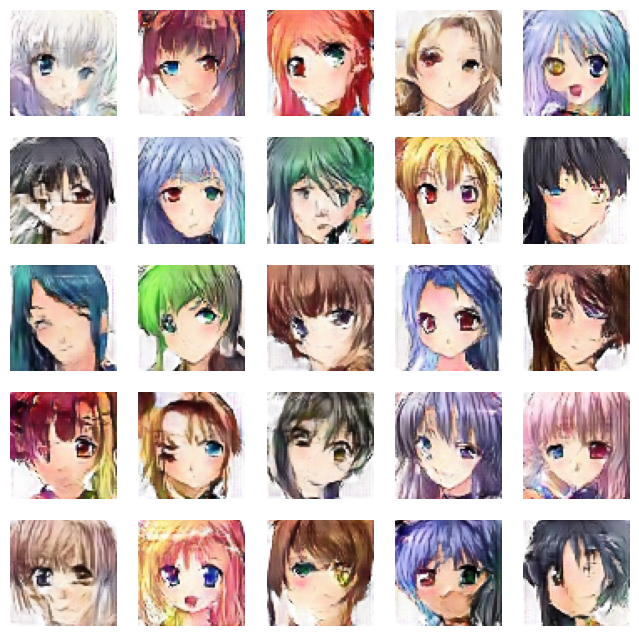

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 123s 62ms/step - d_loss: 0.6823 - g_loss: 0.7782
Epoch 17/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.6794 - g_loss: 0.7899

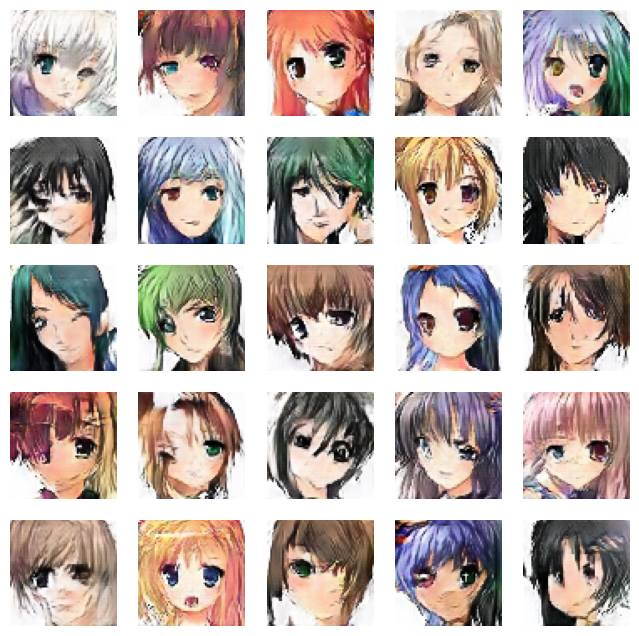

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 122s 61ms/step - d_loss: 0.6794 - g_loss: 0.7899
Epoch 18/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.6744 - g_loss: 0.8053

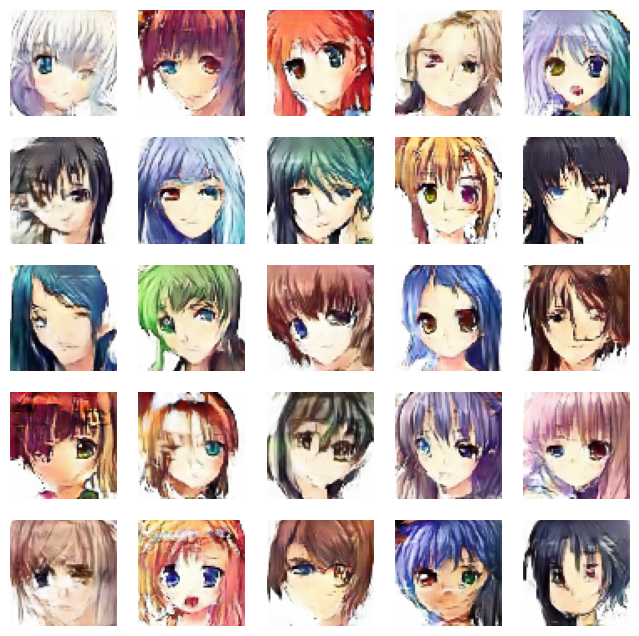

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 122s 61ms/step - d_loss: 0.6744 - g_loss: 0.8053
Epoch 19/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.6693 - g_loss: 0.8181

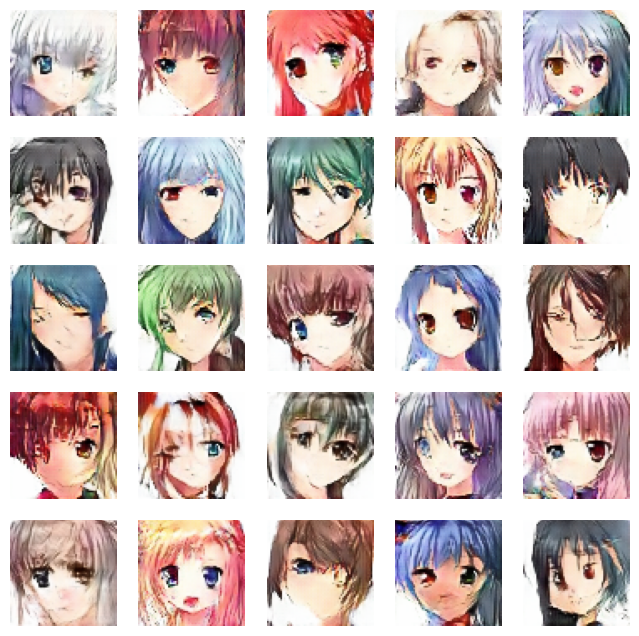

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 121s 61ms/step - d_loss: 0.6693 - g_loss: 0.8181
Epoch 20/20
1986/1987 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - d_loss: 0.6665 - g_loss: 0.8305

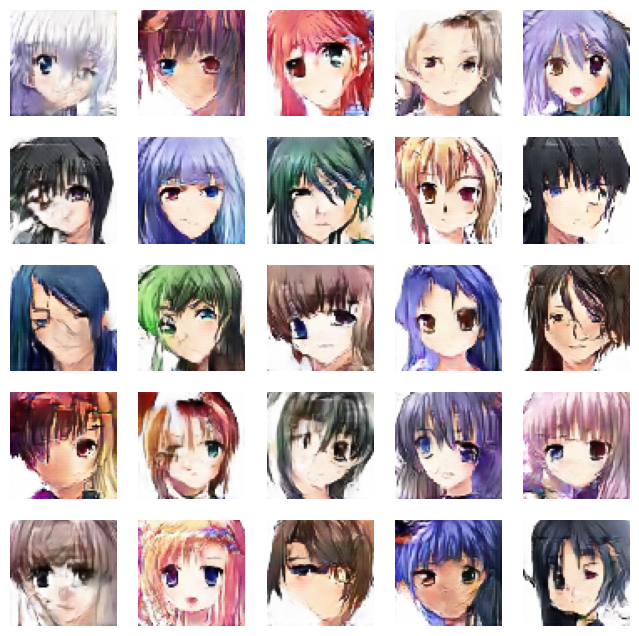

1987/1987 ━━━━━━━━━━━━━━━━━━━━ 122s 61ms/step - d_loss: 0.6665 - g_loss: 0.8305


In [18]:
N_EPOCHS = 20
dcgan.fit(train_images, epochs=N_EPOCHS, callbacks=[DCGANMonitor()])

## Generate New Anime Image

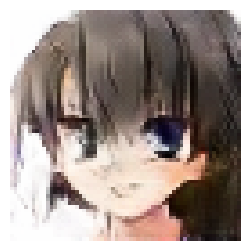

In [19]:
noise = tf.random.normal([1, 100])
fig = plt.figure(figsize=(3, 3))
# generate the image from noise
g_img = dcgan.generator(noise)
# denormalize the image
g_img = (g_img * 127.5) + 127.5
g_img.numpy()
img = array_to_img(g_img[0])
plt.imshow(img)
plt.axis('off')
# plt.savefig('epoch_{:03d}.png'.format(epoch))
plt.show()